# **Table of Contents**

A] Datasets
*   MNIST
*   CIFAR10
*   Tiny Image-Net

B] Model
*   VGG16
*   ResNet
*   GoogLeNet









## IMPORTS

In [1]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as dsets
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm import tqdm
import gc

In [2]:
torch.manual_seed(0)

# If you are using CuDNN , otherwise you can just ignore
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
%load_ext tensorboard

from torch.utils.tensorboard import SummaryWriter



In [4]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## MODELS

**1) VGG16**

In [5]:
import torch.nn as nn
import torch.nn.functional as F


class VGG16(nn.Module):
    def __init__(self, num_classes=10):
        super(VGG16, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(64),
            nn.ReLU(inplace=True))
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(128),
            nn.ReLU(inplace=True))
        self.layer4 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(256),
            nn.ReLU(inplace=True))
        self.layer6 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(256),
            nn.ReLU(inplace=True))
        self.layer7 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer8 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer9 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer10 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer11 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer12 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer13 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.fc = nn.Sequential(
            #nn.Dropout(0.5),
            nn.Linear(7*7*512, 4096),
            nn.ReLU(inplace=True))
        self.fc1 = nn.Sequential(
            nn.Dropout(0.5, inplace=False),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True))
        self.fc2= nn.Sequential(
            nn.Dropout(0.5, inplace=False),
            nn.Linear(4096, num_classes))
        for m in self.modules():
          if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            if m.bias is not None:
              nn.init.constant_(m.bias, 0)
          elif isinstance(m, nn.BatchNorm2d):
            nn.init.constant_(m.weight, 1)
            nn.init.constant_(m.bias, 0)
          elif isinstance(m, nn.Linear):
            nn.init.normal_(m.weight, 0, 0.01)
            nn.init.constant_(m.bias, 0)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        out = self.layer6(out)
        out = self.layer7(out)
        out = self.layer8(out)
        out = self.layer9(out)
        out = self.layer10(out)
        out = self.layer11(out)
        out = self.layer12(out)
        out = self.layer13(out)
        out = self.avgpool(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        out = self.fc1(out)
        out = self.fc2(out)
        return out

In [6]:
model =VGG16(num_classes=10)

# Count the number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print("Total parameters VGG with 10 classes:", total_params)

Total parameters VGG with 10 classes: 134301514


In [7]:
model =VGG16(num_classes=200)

# Count the number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print("Total parameters VGG with 200 classes:", total_params)

Total parameters VGG with 200 classes: 135079944


**2) ResNet**

In [8]:
import torch
import torch.nn as nn


class block(nn.Module):
    def __init__(
        self, in_channels, intermediate_channels, identity_downsample=None, stride=1
    ):
        super().__init__()
        self.expansion = 4
        self.conv1 = nn.Conv2d(
            in_channels,
            intermediate_channels,
            kernel_size=1,
            stride=1,
            padding=0,
            bias=False,
        )
        self.bn1 = nn.BatchNorm2d(intermediate_channels)
        self.conv2 = nn.Conv2d(
            intermediate_channels,
            intermediate_channels,
            kernel_size=3,
            stride=stride,
            padding=1,
            bias=False,
        )
        self.bn2 = nn.BatchNorm2d(intermediate_channels)
        self.conv3 = nn.Conv2d(
            intermediate_channels,
            intermediate_channels * self.expansion,
            kernel_size=1,
            stride=1,
            padding=0,
            bias=False,
        )
        self.bn3 = nn.BatchNorm2d(intermediate_channels * self.expansion)
        self.relu = nn.ReLU()
        self.identity_downsample = identity_downsample
        self.stride = stride

    def forward(self, x):
        identity = x.clone()

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.bn3(x)

        if self.identity_downsample is not None:
            identity = self.identity_downsample(identity)

        x += identity
        x = self.relu(x)
        return x



In [9]:
class ResNet(nn.Module):
    def __init__(self, block, layers, image_channels, num_classes):
        super(ResNet, self).__init__()
        self.in_channels = 64
        self.conv1 = nn.Conv2d(
            image_channels, 64, kernel_size=7, stride=2, padding=3, bias=False
        )
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Essentially the entire ResNet architecture are in these 4 lines below
        self.layer1 = self._make_layer(
            block, layers[0], intermediate_channels=64, stride=1
        )
        self.layer2 = self._make_layer(
            block, layers[1], intermediate_channels=128, stride=2
        )
        self.layer3 = self._make_layer(
            block, layers[2], intermediate_channels=256, stride=2
        )
        self.layer4 = self._make_layer(
            block, layers[3], intermediate_channels=512, stride=2
        )

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * 4, num_classes)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)
        x = self.fc(x)

        return x

    def _make_layer(self, block, num_residual_blocks, intermediate_channels, stride):
            identity_downsample = None
            layers = []

            # Either if we half the input space for ex, 56x56 -> 28x28 (stride=2), or channels changes
            # we need to adapt the Identity (skip connection) so it will be able to be added
            # to the layer that's ahead
            if stride != 1 or self.in_channels != intermediate_channels * 4:
                identity_downsample = nn.Sequential(
                    nn.Conv2d(
                        self.in_channels,
                        intermediate_channels * 4,
                        kernel_size=1,
                        stride=stride,
                        bias=False,
                    ),
                    nn.BatchNorm2d(intermediate_channels * 4),
                )

            layers.append(
                block(self.in_channels, intermediate_channels, identity_downsample, stride)
            )

            # The expansion size is always 4 for ResNet 50,101,152
            self.in_channels = intermediate_channels * 4

            for i in range(num_residual_blocks - 1):
                layers.append(block(self.in_channels, intermediate_channels))

            return nn.Sequential(*layers)



In [10]:
def ResNet50(img_channel=3, num_classes=10):
    return ResNet(block, [3, 4, 6, 3], img_channel, num_classes)

In [11]:
model =ResNet50(num_classes=10)

# Count the number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print("Total parameters ResNet with 10 classes:", total_params)

Total parameters ResNet with 10 classes: 23528522


In [12]:
model =ResNet50(num_classes=200)

# Count the number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print("Total parameters ResNet with 200 classes:", total_params)

Total parameters ResNet with 200 classes: 23917832


**3) GoogLeNet**

In [13]:
import torch
from torch import nn


class GoogLeNet(nn.Module):
    def __init__(self, aux_logits=True, num_classes=10):
        super(GoogLeNet, self).__init__()
        assert aux_logits == True or aux_logits == False
        self.aux_logits = aux_logits

        # Write in_channels, etc, all explicit in self.conv1, rest will write to
        # make everything as compact as possible, kernel_size=3 instead of (3,3)
        self.conv1 = conv_block(
            in_channels=3,
            out_channels=64,
            kernel_size=7,
            stride=2,
            padding=3,
        )

        self.maxpool1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.conv2 = conv_block(64, 192, kernel_size=3, stride=1, padding=1)
        self.maxpool2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # In this order: in_channels, out_1x1, red_3x3, out_3x3, red_5x5, out_5x5, out_1x1pool
        self.inception3a = Inception_block(192, 64, 96, 128, 16, 32, 32)
        self.inception3b = Inception_block(256, 128, 128, 192, 32, 96, 64)
        self.maxpool3 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.inception4a = Inception_block(480, 192, 96, 208, 16, 48, 64)
        self.inception4b = Inception_block(512, 160, 112, 224, 24, 64, 64)
        self.inception4c = Inception_block(512, 128, 128, 256, 24, 64, 64)
        self.inception4d = Inception_block(512, 112, 144, 288, 32, 64, 64)
        self.inception4e = Inception_block(528, 256, 160, 320, 32, 128, 128)
        self.maxpool4 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.inception5a = Inception_block(832, 256, 160, 320, 32, 128, 128)
        self.inception5b = Inception_block(832, 384, 192, 384, 48, 128, 128)

        self.avgpool = nn.AvgPool2d(kernel_size=7, stride=1)
        self.dropout = nn.Dropout(p=0.4)
        self.fc1 = nn.Linear(1024, num_classes)

        if self.aux_logits:
            self.aux1 = InceptionAux(512, num_classes)
            self.aux2 = InceptionAux(528, num_classes)
        else:
            self.aux1 = self.aux2 = None

    def forward(self, x):
        x = self.conv1(x)
        x = self.maxpool1(x)
        x = self.conv2(x)
        x = self.maxpool2(x)

        x = self.inception3a(x)
        x = self.inception3b(x)
        x = self.maxpool3(x)

        x = self.inception4a(x)

        # Auxiliary Softmax classifier 1
        if self.aux_logits and self.training:
            aux1 = self.aux1(x)

        x = self.inception4b(x)
        x = self.inception4c(x)
        x = self.inception4d(x)

        # Auxiliary Softmax classifier 2
        if self.aux_logits and self.training:
            aux2 = self.aux2(x)

        x = self.inception4e(x)
        x = self.maxpool4(x)
        x = self.inception5a(x)
        x = self.inception5b(x)
        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)
        x = self.dropout(x)
        x = self.fc1(x)

        if self.aux_logits and self.training:
            return aux1, aux2, x
        else:
            return x



In [14]:
class Inception_block(nn.Module):
    def __init__(
        self, in_channels, out_1x1, red_3x3, out_3x3, red_5x5, out_5x5, out_1x1pool
    ):
        super(Inception_block, self).__init__()
        self.branch1 = conv_block(in_channels, out_1x1, kernel_size=1)

        self.branch2 = nn.Sequential(
            conv_block(in_channels, red_3x3, kernel_size=1),
            conv_block(red_3x3, out_3x3, kernel_size=(3, 3), padding=1),
        )

        self.branch3 = nn.Sequential(
            conv_block(in_channels, red_5x5, kernel_size=1),
            conv_block(red_5x5, out_5x5, kernel_size=5, padding=2),
        )

        self.branch4 = nn.Sequential(
            nn.MaxPool2d(kernel_size=3, stride=1, padding=1),
            conv_block(in_channels, out_1x1pool, kernel_size=1),
        )

    def forward(self, x):
        return torch.cat(
            [self.branch1(x), self.branch2(x), self.branch3(x), self.branch4(x)], 1
        )


class InceptionAux(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(InceptionAux, self).__init__()
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.7)
        self.pool = nn.AvgPool2d(kernel_size=5, stride=3)
        self.conv = conv_block(in_channels, 128, kernel_size=1)
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        x = self.pool(x)
        x = self.conv(x)
        x = x.reshape(x.shape[0], -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


class conv_block(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(conv_block, self).__init__()
        self.relu = nn.ReLU()
        self.conv = nn.Conv2d(in_channels, out_channels, **kwargs)
        self.batchnorm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        return self.relu(self.batchnorm(self.conv(x)))

In [15]:
model =GoogLeNet(num_classes=200, aux_logits=False)

# Count the number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print("Total parameters GoogLeNet with 200 classes:", total_params)

Total parameters GoogLeNet with 200 classes: 6188824


In [16]:
model =GoogLeNet(num_classes=10, aux_logits=False)

# Count the number of parameters in the model
total_params = sum(p.numel() for p in model.parameters())
print("Total parameters GoogLeNet with 10 classes:", total_params)

Total parameters GoogLeNet with 10 classes: 5994074


# TRAINING

## TRAINING FUNCTIONS

In [33]:
NUM_EPOCHS = 10
input_size = (64,64)

In [18]:
def plot_accuracy(title, train_accuracy, test_accuracy):
    epochs = range(1, len(train_accuracy) + 1)

    plt.plot(epochs, train_accuracy, '-', label='Training accuracy')
    plt.plot(epochs, test_accuracy, '-', label='Testing accuracy')
    plt.title(f'{title} Training and Testing Accuracy')
    plt.xticks(epochs)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

def plot_loss(title, train_loss):
    epochs = range(1, len(train_loss) + 1)

    plt.plot(epochs, train_loss, '-', label='Training loss')
    plt.title(f'{title} Loss Accuracy')
    plt.xticks(epochs)
    plt.ylim(ymin=0)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


def plot_results(title, results):
  train_accuracy, test_accuracy, train_loss = results
  plot_accuracy(title, train_accuracy, test_accuracy)
  plot_loss(title, train_loss)

In [19]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
import numpy as np

def createConfusionMatrix(model, loader, num_classes):
    y_pred = [] # save predction
    y_true = [] # save ground truth

    # iterate over data
    for inputs, labels in loader:

        if torch.cuda.is_available():
          inputs = inputs.cuda()
          labels = labels.cuda()

        output = model(inputs)  # Feed Network

        output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
        y_pred.extend(output)  # save prediction

        labels = labels.data.cpu().numpy()
        y_true.extend(labels)  # save ground truth

    # constant for classes
    classes = range(1, num_classes + 1)
    classes = [str(class_) for class_ in classes]

    # Build confusion matrix
    cf_matrix = confusion_matrix(y_true, y_pred)
    df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index=[i for i in classes],
                         columns=[i for i in classes])
    plt.figure(figsize=(12, 7))
    return sn.heatmap(df_cm, annot=True).get_figure()


In [20]:
def evaluation(model, data_loader):
    # initiate model evaluation
    model.eval()
    total, correct = 0, 0

    with torch.no_grad():
      TP=0
      FP=0
      FN=0
      for data in data_loader:
          inputs, label = data

          # use google colab gpu if available
          if torch.cuda.is_available():
              inputs = inputs.cuda()
              label = label.cuda()

          outputs = model(inputs)
          _, pred = torch.max(outputs.data, 1)
          TP += (pred & label).sum().item()
          FP += (pred & ~label).sum().item()
          FN += (~pred & label).sum().item()

          if TP + FP != 0:
            precision = 0.0
          else:
            precision = TP / (TP + FP)

          if TP + FN != 0:
            recall = TP / (TP + FN)
          else:
            recall = 0.0

          if precision + recall == 0:
            f1_score = 0
          else:
            f1_score = 2 * (precision * recall) / (precision + recall)

          total = total + label.size(0)
          correct = correct + (pred == label).sum().item()
          # calculate accuracy
          accuracy = 100.0 * (correct / total)

    return accuracy, f1_score, precision, recall

In [21]:
def train(run_name, dataset_name, model, criterion, optimizer, num_epochs, training_loader, test_loader):
  writer=SummaryWriter(f'runs/{run_name}')
  # total loss
  total_loss = []
  # training accuracy
  train_accuracy = []
  # testing accuracy
  test_accuracy = []

  # Move the model to GPU if available
  if torch.cuda.is_available():
      model.cuda()

  for epoch in range(num_epochs):
      # loss (batches)
      loss_list = []
      for i, (images, labels) in enumerate(tqdm(training_loader), 0):
          # train
          model.train()

          # Move data to GPU if available
          if torch.cuda.is_available():
              images = images.cuda()
              labels = labels.cuda()

          # forward pass
          outputs = model(images)

          # calculate loss
          loss = criterion(outputs, labels)
          writer.add_scalar(f'{dataset_name}/Loss/Train', loss, epoch)

          # append loss to loss in batches
          loss_list.append(loss.item())

          # zero the gradient
          optimizer.zero_grad()

          # backpropagation
          loss.backward()

          # SGD optimisation
          optimizer.step()

      # training accuracy
      train_acc, f1_score, precision, recall = evaluation(model, training_loader)
      train_accuracy.append(train_acc)
      writer.add_scalar(f'{dataset_name}/Accuracy/Train', train_acc, epoch)

      # testing accuracy
      test_acc, f1_score, precision, recall = evaluation(model, test_loader)
      test_accuracy.append(test_acc)
      writer.add_scalar(f'{dataset_name}/Accuracy/Test', test_acc, epoch)


      if dataset_name == "MNIST" or dataset_name == "CIFAR10":
        num_classes = 10
      else:
        num_classes = 200
      # store total loss
      total_loss.append(sum(loss_list))
      writer.add_figure(f"{dataset_name} {run_name}/Confusion matrix", createConfusionMatrix(model, training_loader, num_classes), epoch)

      print('Epoch [{}/{}], Loss: {:.4f}, Train Accuracy: {:.2f}%, Test Accuracy: {:.2f}%'.format(epoch + 1, num_epochs, sum(loss_list), train_acc, test_acc))
  print(f'recall: {recall:.4f},  precision: {precision:.4f}, F1 score: {f1_score:.4f}')

  writer.flush()
  writer.close()

  return train_accuracy, test_accuracy, total_loss

## MNIST

In [22]:
transform = transforms.Compose([transforms.Resize(input_size), torchvision.transforms.Grayscale(num_output_channels=3), transforms.ToTensor(), transforms.Normalize((0.7,), (0.7,)),])
train_set = torchvision.datasets.MNIST(root="./data", train=True,download=True, transform=transform)
test_set = torchvision.datasets.MNIST(root="./data", train=False,download=True, transform=transform)

training_loader = torch.utils.data.DataLoader(train_set, batch_size=32,shuffle=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32,shuffle=False, num_workers=2)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:01<00:00, 5079771.67it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 129779.67it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:01<00:00, 1083382.51it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 6167215.53it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



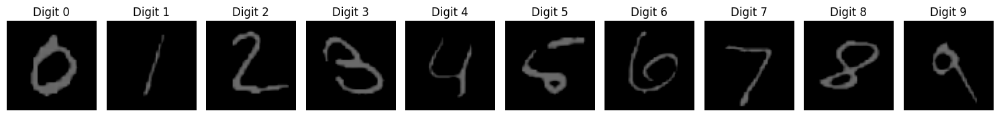

In [23]:
class_examples = {}

for image, label in test_set:
    if len(class_examples) == 10:
        break
    if label not in class_examples:
        class_examples[label] = image


fig, axs = plt.subplots(1, 10, figsize=(15, 5))

for i in range(10):
    axs[i].imshow(torch.clip(class_examples[i].permute(1, 2, 0), 0,1), cmap='gray')
    axs[i].set_title(f"Digit {i}")
    axs[i].axis('off')

plt.tight_layout()
plt.show()

**TRAINING**

In [23]:
# init CNN model
model = VGG16(num_classes=10).to(device)

# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss().to(device)
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
#optimizer = optim.ADAM(model.parameters(), lr=learning_rate)


results = train('run_vgg_number1', 'MNIST', model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:22<00:00, 85.18it/s]


Epoch [1/15], Loss: 1298.7073, Train Accuracy: 96.55%, Test Accuracy: 96.79%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 92.04it/s]


Epoch [2/15], Loss: 173.3832, Train Accuracy: 96.38%, Test Accuracy: 96.53%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.26it/s]


Epoch [3/15], Loss: 112.0926, Train Accuracy: 98.88%, Test Accuracy: 98.67%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.72it/s]


Epoch [4/15], Loss: 83.2134, Train Accuracy: 99.17%, Test Accuracy: 98.82%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 92.21it/s]


Epoch [5/15], Loss: 63.2350, Train Accuracy: 99.35%, Test Accuracy: 99.07%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.49it/s]


Epoch [6/15], Loss: 52.1702, Train Accuracy: 99.37%, Test Accuracy: 98.95%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.72it/s]


Epoch [7/15], Loss: 40.9909, Train Accuracy: 99.64%, Test Accuracy: 99.07%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.92it/s]


Epoch [8/15], Loss: 32.1194, Train Accuracy: 99.64%, Test Accuracy: 98.98%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.97it/s]


Epoch [9/15], Loss: 27.9233, Train Accuracy: 99.62%, Test Accuracy: 98.96%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.89it/s]


Epoch [10/15], Loss: 25.0182, Train Accuracy: 99.68%, Test Accuracy: 99.05%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.82it/s]


Epoch [11/15], Loss: 17.8833, Train Accuracy: 99.82%, Test Accuracy: 99.15%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.75it/s]


Epoch [12/15], Loss: 14.5096, Train Accuracy: 99.95%, Test Accuracy: 99.20%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.55it/s]


Epoch [13/15], Loss: 11.8633, Train Accuracy: 99.83%, Test Accuracy: 98.99%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.32it/s]


Epoch [14/15], Loss: 10.6903, Train Accuracy: 99.66%, Test Accuracy: 98.93%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:20<00:00, 91.99it/s]


Epoch [15/15], Loss: 10.5224, Train Accuracy: 99.95%, Test Accuracy: 99.19%
recall: 0.9922,  precision: 0.0000, F1 score: 0.0000


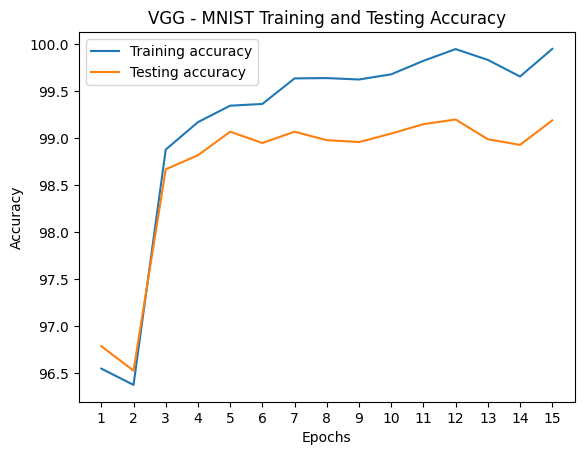

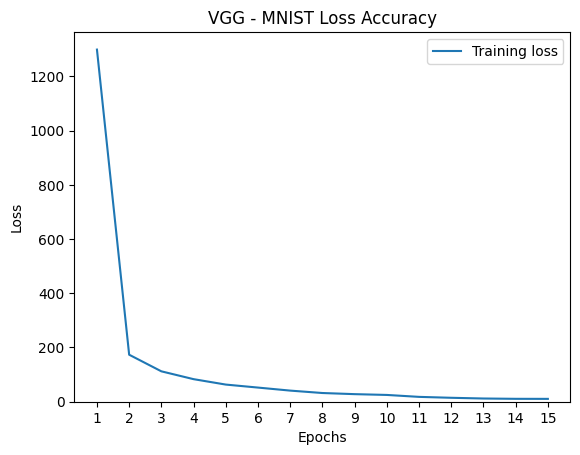

In [24]:
plot_results('VGG - MNIST', results)

In [25]:
gc.collect()
torch.cuda.empty_cache()

**TRAINING ON MNIST (RESNET)**

In [26]:
model = ResNet50().to(device)

# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
#optimizer = optim.ADAM(model.parameters(), lr=learning_rate)

train('run_resnet50_number1', 'MNIST',model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:49<00:00, 37.70it/s]


Epoch [1/15], Loss: 324.2555, Train Accuracy: 98.72%, Test Accuracy: 98.42%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:49<00:00, 37.92it/s]


Epoch [2/15], Loss: 88.6951, Train Accuracy: 99.41%, Test Accuracy: 98.89%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.36it/s]


Epoch [3/15], Loss: 51.1443, Train Accuracy: 99.71%, Test Accuracy: 98.97%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.11it/s]


Epoch [4/15], Loss: 27.9908, Train Accuracy: 99.78%, Test Accuracy: 99.06%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:49<00:00, 37.51it/s]


Epoch [5/15], Loss: 18.0576, Train Accuracy: 99.94%, Test Accuracy: 99.22%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.15it/s]


Epoch [6/15], Loss: 12.5640, Train Accuracy: 99.93%, Test Accuracy: 99.27%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.11it/s]


Epoch [7/15], Loss: 8.0590, Train Accuracy: 99.96%, Test Accuracy: 99.30%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.35it/s]


Epoch [8/15], Loss: 5.8371, Train Accuracy: 99.99%, Test Accuracy: 99.30%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|█████████▉| 1874/1875 [00:50<00:00, 37.15it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.18it/s]


Epoch [9/15], Loss: 6.5479, Train Accuracy: 99.96%, Test Accuracy: 99.30%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 36.81it/s]


Epoch [10/15], Loss: 5.8559, Train Accuracy: 99.98%, Test Accuracy: 99.30%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 36.93it/s]


Epoch [11/15], Loss: 3.9727, Train Accuracy: 99.98%, Test Accuracy: 99.35%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:51<00:00, 36.22it/s]


Epoch [12/15], Loss: 1.4967, Train Accuracy: 100.00%, Test Accuracy: 99.39%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:51<00:00, 36.61it/s]


Epoch [13/15], Loss: 1.2860, Train Accuracy: 99.99%, Test Accuracy: 99.29%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:50<00:00, 37.47it/s]


Epoch [14/15], Loss: 0.9659, Train Accuracy: 100.00%, Test Accuracy: 99.37%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:52<00:00, 35.82it/s]


Epoch [15/15], Loss: 0.7045, Train Accuracy: 100.00%, Test Accuracy: 99.40%
recall: 0.9946,  precision: 0.0000, F1 score: 0.0000


([98.725,
  99.41166666666666,
  99.70833333333333,
  99.78166666666667,
  99.93833333333333,
  99.92666666666666,
  99.96166666666667,
  99.98833333333333,
  99.96000000000001,
  99.98,
  99.97500000000001,
  100.0,
  99.99166666666667,
  100.0,
  100.0],
 [98.42,
  98.89,
  98.97,
  99.06,
  99.22,
  99.27,
  99.3,
  99.3,
  99.3,
  99.3,
  99.35000000000001,
  99.39,
  99.29,
  99.37,
  99.4],
 [324.25553254270926,
  88.69512037566165,
  51.1442751105933,
  27.99083225725917,
  18.057643897678645,
  12.564015531123005,
  8.058991588819481,
  5.837113637015136,
  6.547942929633791,
  5.855870596633395,
  3.9727440175338415,
  1.4966710091202913,
  1.2859956577281082,
  0.965938883947274,
  0.7044928891473319])

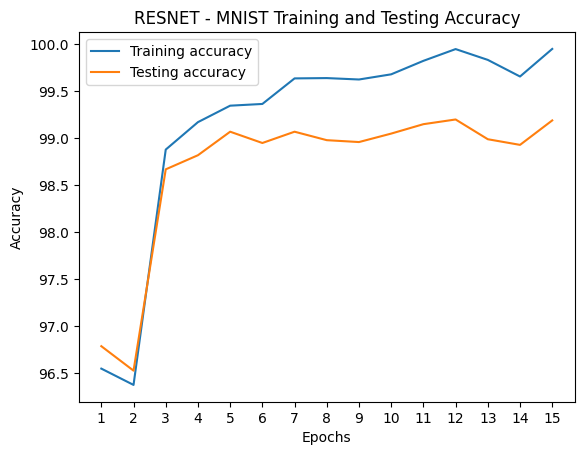

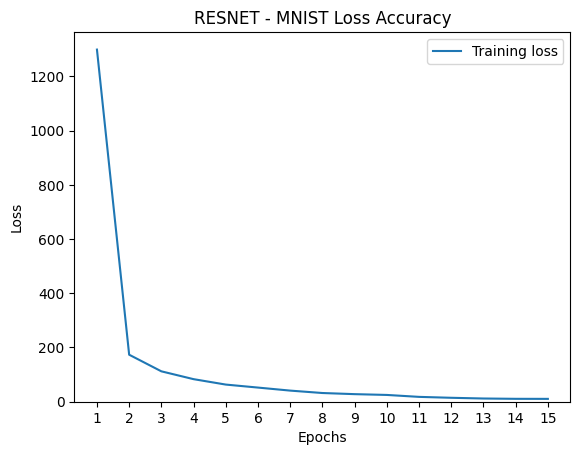

In [27]:
plot_results('RESNET - MNIST', results)

In [28]:
gc.collect()
torch.cuda.empty_cache()

## CIFAR10

In [34]:
transform = transforms.Compose([transforms.Resize(input_size), transforms.ToTensor(),transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),])
train_set = torchvision.datasets.CIFAR10(root="./data", train=True,download=True, transform=transform)
test_set = torchvision.datasets.CIFAR10(root="./data", train=False,download=True, transform=transform)

training_loader = torch.utils.data.DataLoader(train_set, batch_size=32,shuffle=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32,shuffle=False, num_workers=2)

100%|██████████| 170498071/170498071 [00:25<00:00, 6812783.42it/s] 


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


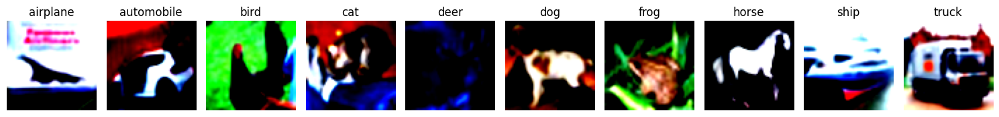

In [35]:
class_examples = {}

for image, label in test_set:
    if len(class_examples) == 10:
        break
    if label not in class_examples:
        class_examples[label] = image
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


fig, axs = plt.subplots(1, 10, figsize=(15, 5))

for i in range(10):
    axs[i].imshow(torch.clip(class_examples[i].permute(1, 2, 0), 0,1))
    axs[i].set_title(class_names[i])
    axs[i].axis('off')

plt.tight_layout()
plt.show()

TRAINING FOR **CIFAR10**

In [36]:
# init CNN model
model = VGG16(num_classes=10).to(device)

# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
#optimizer = optim.ADAM(model.parameters(), lr=learning_rate)

train('run_vgg_number2', 'CIFAR10',model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 90.84it/s]


Epoch [1/10], Loss: 3122.4778, Train Accuracy: 34.68%, Test Accuracy: 35.11%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 91.29it/s]


Epoch [2/10], Loss: 2421.4909, Train Accuracy: 43.26%, Test Accuracy: 42.45%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 91.22it/s]


Epoch [3/10], Loss: 2065.3152, Train Accuracy: 55.92%, Test Accuracy: 55.09%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 90.90it/s]


Epoch [4/10], Loss: 1772.1564, Train Accuracy: 64.59%, Test Accuracy: 62.35%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 91.61it/s]


Epoch [5/10], Loss: 1534.4553, Train Accuracy: 67.35%, Test Accuracy: 64.21%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 90.73it/s]


Epoch [6/10], Loss: 1335.9603, Train Accuracy: 73.72%, Test Accuracy: 69.16%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 91.38it/s]


Epoch [7/10], Loss: 1165.2298, Train Accuracy: 77.34%, Test Accuracy: 71.47%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 90.48it/s]


Epoch [8/10], Loss: 1026.6762, Train Accuracy: 76.30%, Test Accuracy: 70.24%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 90.65it/s]


Epoch [9/10], Loss: 888.3911, Train Accuracy: 82.99%, Test Accuracy: 74.38%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:17<00:00, 90.85it/s]


Epoch [10/10], Loss: 768.4502, Train Accuracy: 86.33%, Test Accuracy: 76.20%
recall: 0.8541,  precision: 0.0000, F1 score: 0.0000


([34.68,
  43.256,
  55.922000000000004,
  64.594,
  67.354,
  73.71799999999999,
  77.338,
  76.298,
  82.992,
  86.328],
 [35.11,
  42.449999999999996,
  55.089999999999996,
  62.35000000000001,
  64.21,
  69.16,
  71.47,
  70.24000000000001,
  74.38,
  76.2],
 [3122.477759003639,
  2421.4909274578094,
  2065.3152304291725,
  1772.1564059257507,
  1534.4553218781948,
  1335.960301309824,
  1165.229828953743,
  1026.676191136241,
  888.3910709321499,
  768.4501838982105])

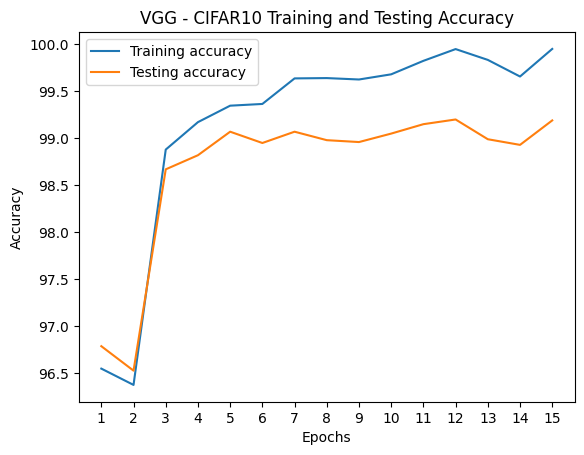

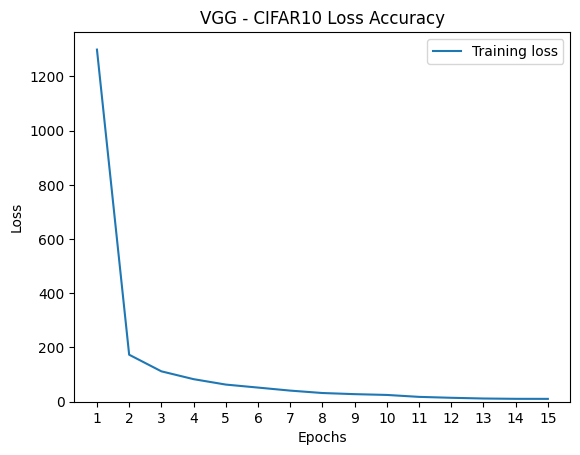

In [37]:
plot_results('VGG - CIFAR10', results)

In [38]:
gc.collect()
torch.cuda.empty_cache()

**TRAINING ON CIFAR10 (RESNET)**

In [39]:
# init CNN model
model = ResNet50(num_classes=10).to(device)

# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)
#optimizer = optim.ADAM(model.parameters(), lr=learning_rate)

train('run_resnet50_number2', 'CIFAR10',model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:44<00:00, 35.35it/s]


Epoch [1/10], Loss: 2773.0211, Train Accuracy: 49.27%, Test Accuracy: 46.95%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:44<00:00, 35.48it/s]


Epoch [2/10], Loss: 2032.4747, Train Accuracy: 60.54%, Test Accuracy: 56.02%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:44<00:00, 35.17it/s]


Epoch [3/10], Loss: 1698.5740, Train Accuracy: 63.95%, Test Accuracy: 57.11%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:43<00:00, 35.70it/s]


Epoch [4/10], Loss: 1425.9147, Train Accuracy: 71.04%, Test Accuracy: 61.50%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:43<00:00, 35.98it/s]


Epoch [5/10], Loss: 1202.6478, Train Accuracy: 74.52%, Test Accuracy: 62.67%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:43<00:00, 35.60it/s]


Epoch [6/10], Loss: 985.8985, Train Accuracy: 81.36%, Test Accuracy: 66.18%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:44<00:00, 35.08it/s]


Epoch [7/10], Loss: 815.2035, Train Accuracy: 87.52%, Test Accuracy: 67.63%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:43<00:00, 35.74it/s]


Epoch [8/10], Loss: 643.4490, Train Accuracy: 93.27%, Test Accuracy: 70.37%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:43<00:00, 35.64it/s]


Epoch [9/10], Loss: 496.0437, Train Accuracy: 89.17%, Test Accuracy: 66.76%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [00:43<00:00, 36.00it/s]


Epoch [10/10], Loss: 397.0634, Train Accuracy: 94.78%, Test Accuracy: 70.27%
recall: 0.8125,  precision: 0.0000, F1 score: 0.0000


([49.268,
  60.544,
  63.946000000000005,
  71.038,
  74.524,
  81.364,
  87.518,
  93.268,
  89.168,
  94.78],
 [46.949999999999996,
  56.02,
  57.11000000000001,
  61.5,
  62.67,
  66.18,
  67.63,
  70.37,
  66.75999999999999,
  70.27],
 [2773.0211312770844,
  2032.4747480750084,
  1698.5739913582802,
  1425.9146975278854,
  1202.6477637290955,
  985.8984721601009,
  815.203491538763,
  643.4489773400128,
  496.04374374076724,
  397.0634363181889])

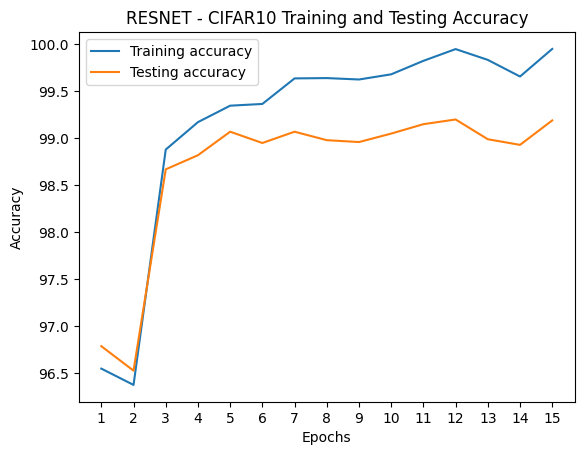

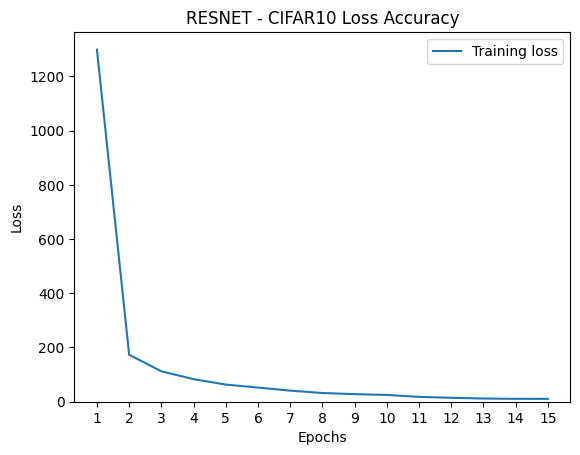

In [40]:
plot_results('RESNET - CIFAR10', results)

In [41]:
gc.collect()
torch.cuda.empty_cache()

## TINY IMAGENET


In [ ]:
from google.colab import drive

drive.mount('/content/gdrive',force_remount=True)

%reload_ext autoreload

%autoreload 2

Mounted at /content/gdrive


In [ ]:
import zipfile
#path_to_zip_file = '/content/gdrive/My Drive/Colab Notebooks/tiny-imagenet-200.zip'
path_to_zip_file = '/content/gdrive/My Drive/datasets/tiny-imagenet-200.zip'

directory_to_extract_to = '/content/data'

with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
  zip_ref.extractall(directory_to_extract_to)

In [ ]:
train_transform = transforms.Compose([
  transforms.RandomCrop(64, padding=4),
  transforms.RandomHorizontalFlip(),
  #transforms.Resize((227,227)),
  transforms.ToTensor(),
  transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
  transforms.RandomErasing(0.25)
])

test_transform = transforms.Compose([
  #transforms.Resize((227,227)),
  transforms.ToTensor(),
  transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
  ])

#transform = transforms.Compose([transforms.Resize((227,227)), transforms.ToTensor(), transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),])
train_set = torchvision.datasets.ImageFolder(root="/content/data/tiny-imagenet-200/new_train", transform=train_transform)
test_set = torchvision.datasets.ImageFolder(root="/content/data/tiny-imagenet-200/new_test", transform=test_transform)

training_loader = torch.utils.data.DataLoader(train_set, batch_size=32,shuffle=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32,shuffle=False, num_workers=2)

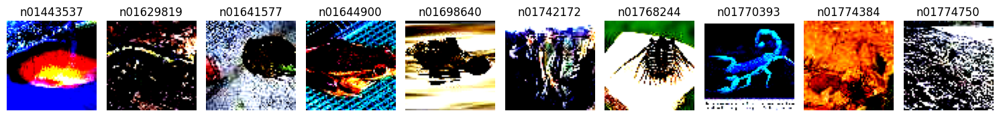

In [ ]:
class_examples = {}

for image, label in test_set:
    class_name = test_set.classes[label]
    if class_name not in class_examples:
        class_examples[class_name] = image
    if len(class_examples) == 10:
        break

# Plot one example per class
fig, axs = plt.subplots(1, 10, figsize=(15, 5))

for i, (class_name, example_image) in enumerate(class_examples.items()):
    axs[i].imshow(torch.clip(example_image.permute(1, 2, 0),0,1))
    axs[i].set_title(class_name)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

**TRAINING**

In [ ]:
# init CNN model
model = VGG16(num_classes=200).to(device)

# learning rate
learning_rate = 0.001
# loss function
criterion = nn.CrossEntropyLoss()
criterion.to(device)
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=5e-4)
#optimizer = optim.ADAM(model.parameters(), lr=learning_rate)

train('run_vgg_number3', 'Tiny ImageNet',model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.41it/s]


Epoch [1/15], Loss: 12681.5190, Train Accuracy: 1.04%, Test Accuracy: 1.03%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.41it/s]


Epoch [2/15], Loss: 12465.6880, Train Accuracy: 1.89%, Test Accuracy: 1.90%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.42it/s]


Epoch [3/15], Loss: 11895.7741, Train Accuracy: 3.86%, Test Accuracy: 3.78%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.38it/s]


Epoch [4/15], Loss: 11321.9763, Train Accuracy: 5.46%, Test Accuracy: 5.46%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.38it/s]


Epoch [5/15], Loss: 10852.7038, Train Accuracy: 8.30%, Test Accuracy: 8.47%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.40it/s]


Epoch [6/15], Loss: 10359.8256, Train Accuracy: 8.43%, Test Accuracy: 8.29%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.36it/s]


Epoch [7/15], Loss: 9902.7296, Train Accuracy: 12.34%, Test Accuracy: 12.80%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.44it/s]


Epoch [8/15], Loss: 9484.7874, Train Accuracy: 16.12%, Test Accuracy: 15.75%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.38it/s]


Epoch [9/15], Loss: 9106.6408, Train Accuracy: 18.46%, Test Accuracy: 18.23%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.39it/s]


Epoch [10/15], Loss: 8770.1417, Train Accuracy: 20.40%, Test Accuracy: 20.34%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.36it/s]


Epoch [11/15], Loss: 8492.6608, Train Accuracy: 23.57%, Test Accuracy: 22.91%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.48it/s]


Epoch [12/15], Loss: 8237.1214, Train Accuracy: 23.78%, Test Accuracy: 23.05%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.36it/s]


Epoch [13/15], Loss: 7986.2408, Train Accuracy: 26.41%, Test Accuracy: 24.92%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:57<00:00, 20.48it/s]


Epoch [14/15], Loss: 7775.5513, Train Accuracy: 27.87%, Test Accuracy: 26.32%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:58<00:00, 20.37it/s]


Epoch [15/15], Loss: 7570.5594, Train Accuracy: 30.98%, Test Accuracy: 28.94%
recall: 0.6261,  precision: 0.0000, F1 score: 0.0000


([1.0363636363636364,
  1.8948051948051947,
  3.861038961038961,
  5.462337662337662,
  8.301298701298702,
  8.428571428571429,
  12.344155844155843,
  16.124675324675326,
  18.45714285714286,
  20.4,
  23.57012987012987,
  23.78051948051948,
  26.405194805194803,
  27.87272727272727,
  30.98051948051948],
 [1.0333333333333332,
  1.9030303030303028,
  3.775757575757576,
  5.463636363636364,
  8.466666666666667,
  8.293939393939393,
  12.803030303030303,
  15.748484848484848,
  18.23333333333333,
  20.342424242424244,
  22.906060606060606,
  23.054545454545455,
  24.921212121212122,
  26.321212121212124,
  28.94242424242424],
 [12681.51901102066,
  12465.688038825989,
  11895.774095535278,
  11321.976310253143,
  10852.703788280487,
  10359.825641393661,
  9902.729553699493,
  9484.787370920181,
  9106.640771389008,
  8770.141676902771,
  8492.660801410675,
  8237.121410608292,
  7986.240804672241,
  7775.551326036453,
  7570.559404373169])

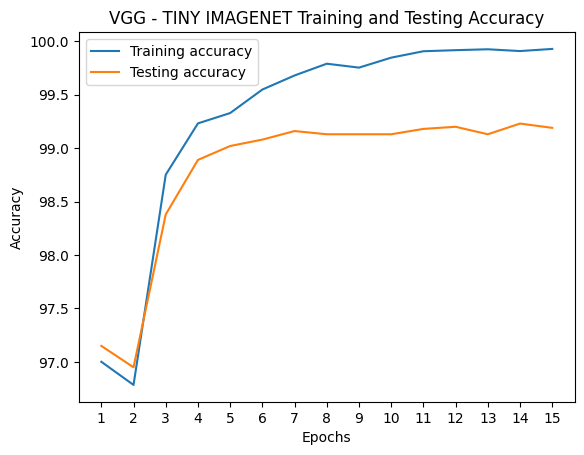

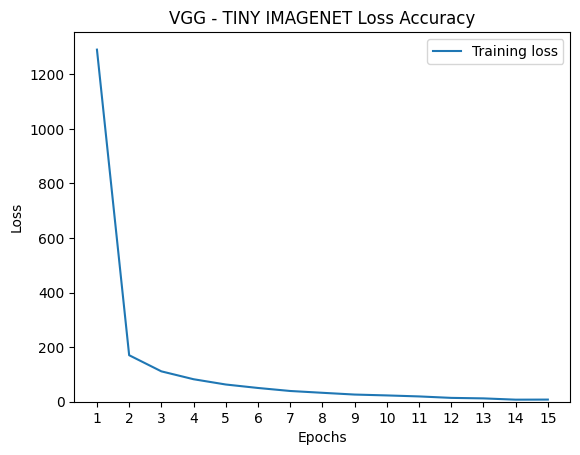

In [ ]:
plot_results('VGG - TINY IMAGENET', results)

In [ ]:
gc.collect()
torch.cuda.empty_cache()

## **TRAINING**

**TRAINING ON TINY IMAGENET**

In [ ]:
# init CNN model
model = ResNet50(num_classes=200).to(device)

# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

train('run_resnet50_number3', 'Tiny ImageNet',model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:16<00:00, 31.53it/s]


Epoch [1/15], Loss: 12223.6868, Train Accuracy: 4.16%, Test Accuracy: 4.30%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:15<00:00, 31.86it/s]


Epoch [2/15], Loss: 10886.4189, Train Accuracy: 9.82%, Test Accuracy: 9.60%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:16<00:00, 31.50it/s]


Epoch [3/15], Loss: 9938.3419, Train Accuracy: 12.43%, Test Accuracy: 12.39%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:15<00:00, 32.03it/s]


Epoch [4/15], Loss: 9217.3509, Train Accuracy: 15.61%, Test Accuracy: 15.00%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:16<00:00, 31.30it/s]


Epoch [5/15], Loss: 8669.6093, Train Accuracy: 19.30%, Test Accuracy: 18.10%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:16<00:00, 31.54it/s]


Epoch [6/15], Loss: 8272.8776, Train Accuracy: 23.26%, Test Accuracy: 21.49%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:15<00:00, 31.68it/s]


Epoch [7/15], Loss: 7886.8530, Train Accuracy: 25.79%, Test Accuracy: 22.82%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:18<00:00, 30.63it/s]


Epoch [8/15], Loss: 7546.3641, Train Accuracy: 26.00%, Test Accuracy: 22.70%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:18<00:00, 30.71it/s]


Epoch [9/15], Loss: 7233.1955, Train Accuracy: 30.67%, Test Accuracy: 25.84%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:18<00:00, 30.74it/s]


Epoch [10/15], Loss: 6970.6788, Train Accuracy: 33.32%, Test Accuracy: 27.36%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:19<00:00, 30.14it/s]


Epoch [11/15], Loss: 6688.3699, Train Accuracy: 34.23%, Test Accuracy: 27.18%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:16<00:00, 31.33it/s]


Epoch [12/15], Loss: 6435.7371, Train Accuracy: 37.33%, Test Accuracy: 29.06%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:18<00:00, 30.68it/s]


Epoch [13/15], Loss: 6167.1877, Train Accuracy: 36.72%, Test Accuracy: 27.94%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:19<00:00, 30.45it/s]


Epoch [14/15], Loss: 5914.7983, Train Accuracy: 40.80%, Test Accuracy: 29.88%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [01:16<00:00, 31.48it/s]


Epoch [15/15], Loss: 5673.8618, Train Accuracy: 46.52%, Test Accuracy: 32.80%
recall: 0.6456,  precision: 0.0000, F1 score: 0.0000


([4.15974025974026,
  9.81948051948052,
  12.433766233766235,
  15.614285714285714,
  19.302597402597403,
  23.257142857142856,
  25.78961038961039,
  26.0,
  30.667532467532467,
  33.31558441558442,
  34.229870129870136,
  37.32987012987013,
  36.724675324675324,
  40.8038961038961,
  46.52207792207792],
 [4.303030303030303,
  9.603030303030303,
  12.387878787878789,
  14.996969696969698,
  18.103030303030305,
  21.48787878787879,
  22.824242424242424,
  22.7,
  25.842424242424244,
  27.360606060606063,
  27.184848484848484,
  29.06060606060606,
  27.94242424242424,
  29.881818181818183,
  32.7969696969697],
 [12223.686826229095,
  10886.418905973434,
  9938.34194111824,
  9217.350899219513,
  8669.609303236008,
  8272.877595186234,
  7886.853037595749,
  7546.364051818848,
  7233.19547355175,
  6970.678795814514,
  6688.369913697243,
  6435.737051725388,
  6167.187660455704,
  5914.798306107521,
  5673.861794114113])

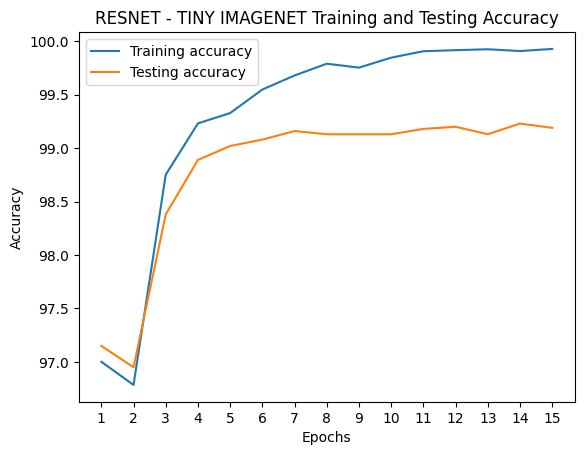

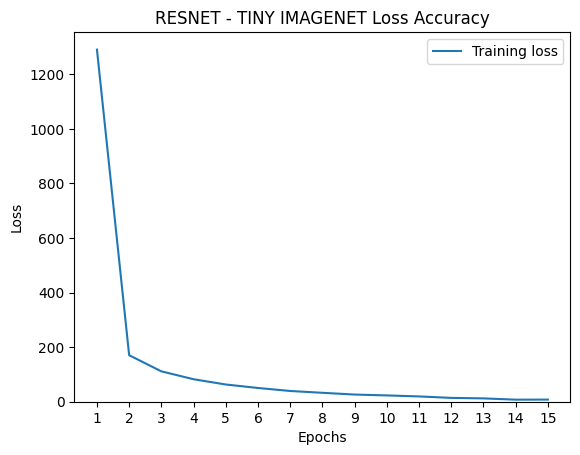

In [ ]:
plot_results('RESNET - TINY IMAGENET', results)

In [ ]:
gc.collect()
torch.cuda.empty_cache()

**TRAINING ON MNIST_GOOGLENET**

In [29]:
googlenet_transform = transforms.Compose([transforms.Resize((224,224)), torchvision.transforms.Grayscale(num_output_channels=3), transforms.ToTensor(), transforms.Normalize((0.7,), (0.7,)),])
googlenet_train_set = torchvision.datasets.MNIST(root="./data", train=True,download=True, transform=googlenet_transform)
googlenet_test_set = torchvision.datasets.MNIST(root="./data", train=False,download=True, transform=googlenet_transform)

googlenet_training_loader = torch.utils.data.DataLoader(googlenet_train_set, batch_size=32,shuffle=True, num_workers=2)
googlenet_test_loader = torch.utils.data.DataLoader(googlenet_test_set, batch_size=32,shuffle=False, num_workers=2)

In [30]:
# init CNN model
model = GoogLeNet(aux_logits=False, num_classes=10).to(device)

# learning rate
learning_rate = 0.001
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

train('run_googLeNet_number1', 'MNIST',model, criterion, optimizer, NUM_EPOCHS, googlenet_training_loader, googlenet_test_loader)

  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:23<00:00, 22.33it/s]


Epoch [1/15], Loss: 1427.0298, Train Accuracy: 97.53%, Test Accuracy: 97.77%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.24it/s]


Epoch [2/15], Loss: 249.1155, Train Accuracy: 98.71%, Test Accuracy: 98.56%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.23it/s]


Epoch [3/15], Loss: 154.8986, Train Accuracy: 99.16%, Test Accuracy: 98.82%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:23<00:00, 22.38it/s]


Epoch [4/15], Loss: 112.6964, Train Accuracy: 99.44%, Test Accuracy: 99.01%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:25<00:00, 22.04it/s]


Epoch [5/15], Loss: 89.3440, Train Accuracy: 99.61%, Test Accuracy: 99.24%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.18it/s]


Epoch [6/15], Loss: 72.7177, Train Accuracy: 99.66%, Test Accuracy: 99.27%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:23<00:00, 22.46it/s]


Epoch [7/15], Loss: 61.1059, Train Accuracy: 99.78%, Test Accuracy: 99.29%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:25<00:00, 22.03it/s]


Epoch [8/15], Loss: 48.9914, Train Accuracy: 99.81%, Test Accuracy: 99.31%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.21it/s]


Epoch [9/15], Loss: 44.0329, Train Accuracy: 99.89%, Test Accuracy: 99.25%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:23<00:00, 22.52it/s]


Epoch [10/15], Loss: 41.1360, Train Accuracy: 99.91%, Test Accuracy: 99.36%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.29it/s]


Epoch [11/15], Loss: 32.8057, Train Accuracy: 99.94%, Test Accuracy: 99.42%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.26it/s]


Epoch [12/15], Loss: 27.8838, Train Accuracy: 99.96%, Test Accuracy: 99.38%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:25<00:00, 21.91it/s]


Epoch [13/15], Loss: 25.2372, Train Accuracy: 99.97%, Test Accuracy: 99.46%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.22it/s]


Epoch [14/15], Loss: 22.2331, Train Accuracy: 99.99%, Test Accuracy: 99.49%


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [01:24<00:00, 22.28it/s]


Epoch [15/15], Loss: 18.7757, Train Accuracy: 99.99%, Test Accuracy: 99.44%
recall: 0.9946,  precision: 0.0000, F1 score: 0.0000


([97.53333333333333,
  98.70833333333333,
  99.16333333333334,
  99.44,
  99.605,
  99.66333333333334,
  99.78,
  99.80666666666667,
  99.88833333333334,
  99.905,
  99.935,
  99.95666666666668,
  99.97333333333333,
  99.98833333333333,
  99.98666666666666],
 [97.77,
  98.56,
  98.82,
  99.00999999999999,
  99.24,
  99.27,
  99.29,
  99.31,
  99.25,
  99.36,
  99.42,
  99.38,
  99.46000000000001,
  99.49,
  99.44],
 [1427.0297524556518,
  249.11552906781435,
  154.8985668150708,
  112.69640359142795,
  89.34401760320179,
  72.71765031618997,
  61.10593481129035,
  48.991387108224444,
  44.0329443810042,
  41.136039554839954,
  32.80568945535924,
  27.8838243058417,
  25.237230731523596,
  22.233089289919008,
  18.775728923967108])

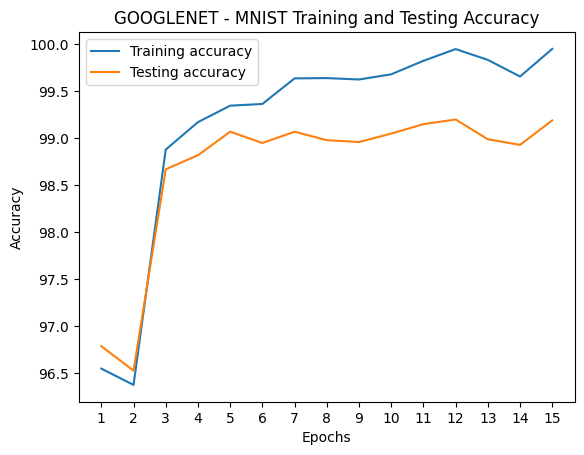

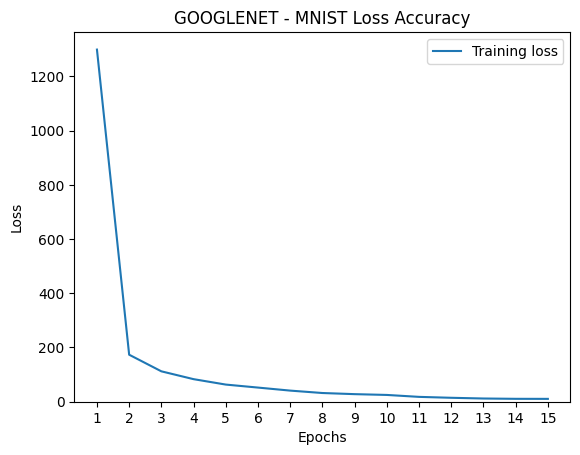

In [31]:
plot_results('GOOGLENET - MNIST', results)

In [32]:
gc.collect()
torch.cuda.empty_cache()

**TRAINING ON CIFAR10_GOOGLENET**

In [42]:
googlenet_transform = transforms.Compose([transforms.Resize((224,224)), transforms.ToTensor(), transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),])
googlenet_train_set = torchvision.datasets.CIFAR10(root="./data", train=True,download=True, transform=googlenet_transform)
googlenet_test_set = torchvision.datasets.CIFAR10(root="./data", train=False,download=True, transform=googlenet_transform)

googlenet_training_loader = torch.utils.data.DataLoader(googlenet_train_set, batch_size=32,shuffle=True, num_workers=2)
googlenet_test_loader = torch.utils.data.DataLoader(googlenet_test_set, batch_size=32,shuffle=False, num_workers=2)

Files already downloaded and verified
Files already downloaded and verified


In [43]:
# init CNN model
model = GoogLeNet(aux_logits=False, num_classes=10)

# learning rate
learning_rate = 0.001
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

train('run_googLeNet_number2', 'CIFAR10', model, criterion, optimizer, NUM_EPOCHS, googlenet_training_loader, googlenet_test_loader)

  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:11<00:00, 21.83it/s]


Epoch [1/10], Loss: 2833.5963, Train Accuracy: 46.53%, Test Accuracy: 45.94%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:12<00:00, 21.54it/s]


Epoch [2/10], Loss: 2203.2157, Train Accuracy: 55.36%, Test Accuracy: 53.91%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:11<00:00, 21.73it/s]


Epoch [3/10], Loss: 1892.8344, Train Accuracy: 59.83%, Test Accuracy: 58.30%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:12<00:00, 21.61it/s]


Epoch [4/10], Loss: 1667.6449, Train Accuracy: 66.32%, Test Accuracy: 63.41%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:12<00:00, 21.51it/s]


Epoch [5/10], Loss: 1494.7273, Train Accuracy: 68.29%, Test Accuracy: 65.03%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:12<00:00, 21.65it/s]


Epoch [6/10], Loss: 1356.1835, Train Accuracy: 72.25%, Test Accuracy: 68.24%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:11<00:00, 21.73it/s]


Epoch [7/10], Loss: 1226.3059, Train Accuracy: 74.23%, Test Accuracy: 68.49%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:12<00:00, 21.66it/s]


Epoch [8/10], Loss: 1116.4961, Train Accuracy: 79.13%, Test Accuracy: 72.39%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:12<00:00, 21.69it/s]


Epoch [9/10], Loss: 1020.0478, Train Accuracy: 82.31%, Test Accuracy: 74.47%


  0%|          | 0/1563 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1563/1563 [01:11<00:00, 21.77it/s]


Epoch [10/10], Loss: 925.0079, Train Accuracy: 84.02%, Test Accuracy: 75.25%
recall: 0.8496,  precision: 0.0000, F1 score: 0.0000


([46.528000000000006,
  55.36,
  59.830000000000005,
  66.316,
  68.28999999999999,
  72.25200000000001,
  74.22999999999999,
  79.13,
  82.312,
  84.02],
 [45.94,
  53.910000000000004,
  58.3,
  63.41,
  65.03,
  68.24,
  68.49,
  72.39,
  74.47,
  75.25],
 [2833.596282839775,
  2203.2157356739044,
  1892.8343950510025,
  1667.644893169403,
  1494.727312207222,
  1356.183460444212,
  1226.3059385418892,
  1116.4961138665676,
  1020.0477716326714,
  925.0078684836626])

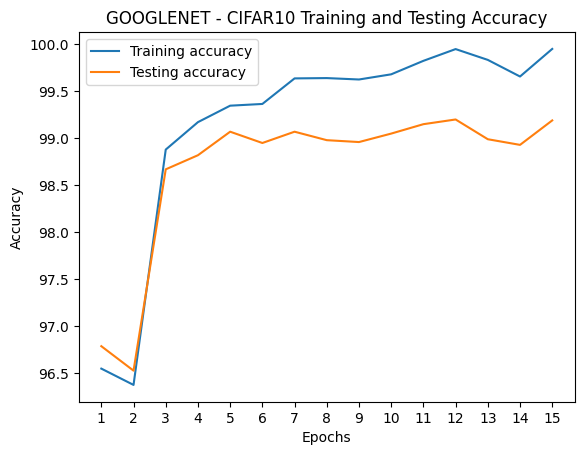

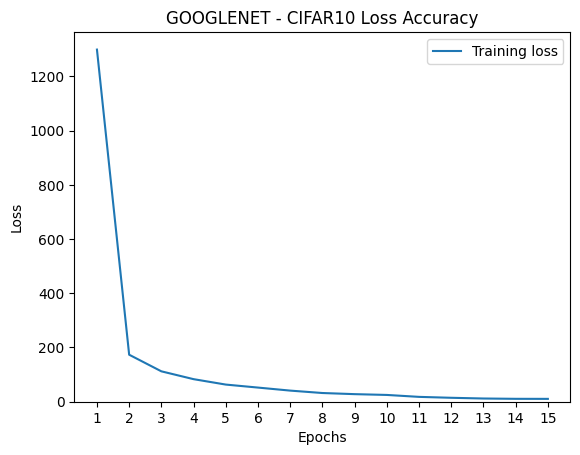

In [44]:
plot_results('GOOGLENET - CIFAR10', results)

In [45]:
gc.collect()
torch.cuda.empty_cache()

**TRAINING ON TINY IMAGENET_GOOGLENET**

In [ ]:
train_transform = transforms.Compose([
  transforms.RandomCrop(64, padding=4),
  transforms.RandomHorizontalFlip(),
  transforms.Resize((224,224)),
  transforms.ToTensor(),
  transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
  transforms.RandomErasing(0.25)
])

test_transform = transforms.Compose([
  transforms.Resize((224,224)),
  transforms.ToTensor(),
  transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
  ])

#transform = transforms.Compose([transforms.Resize((227,227)), transforms.ToTensor(), transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),])
train_set = torchvision.datasets.ImageFolder(root="/content/data/tiny-imagenet-200/new_train", transform=train_transform)
test_set = torchvision.datasets.ImageFolder(root="/content/data/tiny-imagenet-200/new_test", transform=test_transform)

training_loader = torch.utils.data.DataLoader(train_set, batch_size=32,shuffle=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32,shuffle=False, num_workers=2)

In [ ]:
# init CNN model
model = GoogLeNet(aux_logits=False, num_classes=200).to(device)

# learning rate
learning_rate = 0.001
# loss function
criterion = nn.CrossEntropyLoss()
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

train('run_googLeNet_number3', 'Tiny ImageNet', model, criterion, optimizer, NUM_EPOCHS, training_loader, test_loader)

  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:39<00:00, 15.10it/s]


Epoch [1/15], Loss: 11392.2407, Train Accuracy: 9.97%, Test Accuracy: 10.18%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.15it/s]


Epoch [2/15], Loss: 9761.5693, Train Accuracy: 15.86%, Test Accuracy: 15.49%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.16it/s]


Epoch [3/15], Loss: 8833.9207, Train Accuracy: 21.31%, Test Accuracy: 21.19%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.23it/s]


Epoch [4/15], Loss: 8149.6472, Train Accuracy: 27.92%, Test Accuracy: 27.09%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.15it/s]


Epoch [5/15], Loss: 7618.9861, Train Accuracy: 32.30%, Test Accuracy: 31.03%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.19it/s]


Epoch [6/15], Loss: 7152.4079, Train Accuracy: 35.80%, Test Accuracy: 33.49%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.24it/s]


Epoch [7/15], Loss: 6779.1747, Train Accuracy: 37.99%, Test Accuracy: 35.55%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.24it/s]


Epoch [8/15], Loss: 6431.0562, Train Accuracy: 42.21%, Test Accuracy: 39.21%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.18it/s]


Epoch [9/15], Loss: 6139.0714, Train Accuracy: 44.03%, Test Accuracy: 40.35%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.33it/s]


Epoch [10/15], Loss: 5877.7547, Train Accuracy: 46.68%, Test Accuracy: 41.92%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.24it/s]


Epoch [11/15], Loss: 5631.1577, Train Accuracy: 48.99%, Test Accuracy: 43.51%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.24it/s]


Epoch [12/15], Loss: 5423.6395, Train Accuracy: 52.23%, Test Accuracy: 45.24%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.22it/s]


Epoch [13/15], Loss: 5216.0682, Train Accuracy: 54.27%, Test Accuracy: 46.15%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:38<00:00, 15.22it/s]


Epoch [14/15], Loss: 5019.1254, Train Accuracy: 54.24%, Test Accuracy: 46.18%


  0%|          | 0/2407 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 2407/2407 [02:37<00:00, 15.28it/s]


Epoch [15/15], Loss: 4844.8200, Train Accuracy: 56.03%, Test Accuracy: 47.08%
recall: 0.7147,  precision: 0.0000, F1 score: 0.0000


([9.966233766233765,
  15.858441558441557,
  21.31168831168831,
  27.915584415584416,
  32.296103896103894,
  35.8,
  37.98701298701299,
  42.214285714285715,
  44.028571428571425,
  46.676623376623375,
  48.98571428571429,
  52.22727272727272,
  54.27012987012987,
  54.24285714285715,
  56.031168831168834],
 [10.175757575757576,
  15.487878787878786,
  21.19090909090909,
  27.090909090909093,
  31.03030303030303,
  33.49393939393939,
  35.54545454545455,
  39.2060606060606,
  40.34848484848485,
  41.92121212121212,
  43.50909090909091,
  45.236363636363635,
  46.154545454545456,
  46.18181818181818,
  47.08181818181818],
 [11392.240732431412,
  9761.56928896904,
  8833.92074084282,
  8149.647178411484,
  7618.986134052277,
  7152.407880783081,
  6779.17472910881,
  6431.056198716164,
  6139.071355819702,
  5877.754685282707,
  5631.157679080963,
  5423.639491677284,
  5216.068241477013,
  5019.125420331955,
  4844.820028543472])

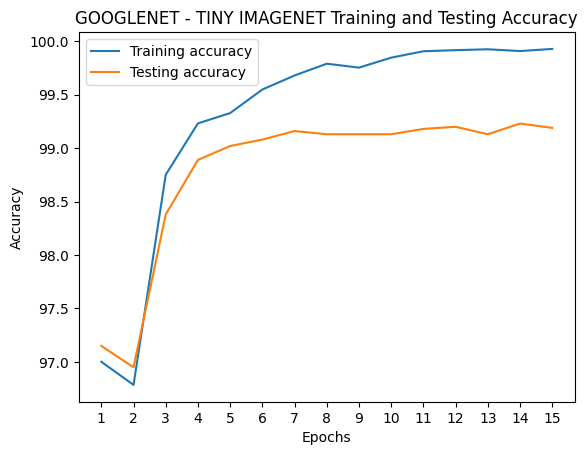

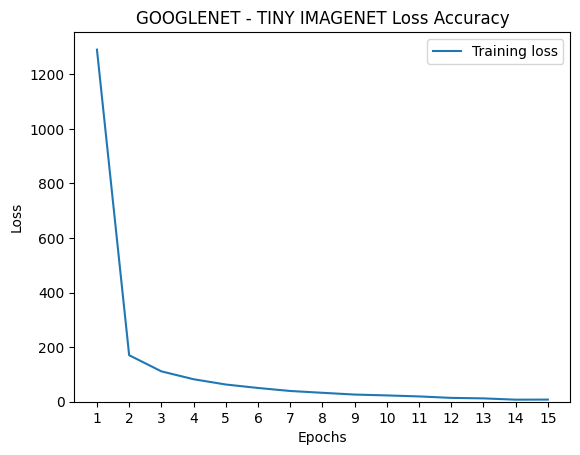

In [ ]:
plot_results('GOOGLENET - TINY IMAGENET', results)

In [ ]:
gc.collect()
torch.cuda.empty_cache()

# EXPERIMENT

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

#epsilons = [0, .05, .1, .15, .2, .25, .3]
epsilons = [0, .25]
pretrained_model = "data/lenet_mnist_model.pth"
use_cuda=True
# Set random seed for reproducibility
torch.manual_seed(42)


import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self, num_classes=10):
        super(Net, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(64),
            nn.ReLU(inplace=True))
        self.layer2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(128),
            nn.ReLU(inplace=True))
        self.layer4 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(256),
            nn.ReLU(inplace=True))
        self.layer6 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(256),
            nn.ReLU(inplace=True))
        self.layer7 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer8 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer9 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
           # nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer10 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.layer11 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer12 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True))
        self.layer13 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            #nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size = 2, stride = 2))
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.fc = nn.Sequential(
            #nn.Dropout(0.5),
            nn.Linear(7*7*512, 4096),
            nn.ReLU(inplace=True))
        self.fc1 = nn.Sequential(
            nn.Dropout(0.5, inplace=False),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True))
        self.fc2= nn.Sequential(
            nn.Dropout(0.5, inplace=False),
            nn.Linear(4096, num_classes))
        for m in self.modules():
          if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            if m.bias is not None:
              nn.init.constant_(m.bias, 0)
          elif isinstance(m, nn.BatchNorm2d):
            nn.init.constant_(m.weight, 1)
            nn.init.constant_(m.bias, 0)
          elif isinstance(m, nn.Linear):
            nn.init.normal_(m.weight, 0, 0.01)
            nn.init.constant_(m.bias, 0)

    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        out = self.layer6(out)
        out = self.layer7(out)
        out = self.layer8(out)
        out = self.layer9(out)
        out = self.layer10(out)
        out = self.layer11(out)
        out = self.layer12(out)
        out = self.layer13(out)
        out = self.avgpool(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        out = self.fc1(out)
        out = self.fc2(out)
        output = F.log_softmax(out, dim=1)
        return output

# LeNet Model definition
# class Net(nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         self.conv1 = nn.Conv2d(1, 32, 3, 1)
#         self.conv2 = nn.Conv2d(32, 64, 3, 1)
#         self.dropout1 = nn.Dropout(0.25)
#         self.dropout2 = nn.Dropout(0.5)
#         self.fc1 = nn.Linear(9216, 128)
#         self.fc2 = nn.Linear(128, 10)

#     def forward(self, x):
#         x = self.conv1(x)
#         x = F.relu(x)
#         x = self.conv2(x)
#         x = F.relu(x)
#         x = F.max_pool2d(x, 2)
#         x = self.dropout1(x)
#         x = torch.flatten(x, 1)
#         x = self.fc1(x)
#         x = F.relu(x)
#         x = self.dropout2(x)
#         x = self.fc2(x)
#         output = F.log_softmax(x, dim=1)
#         return output

# MNIST Test dataset and dataloader declaration
test_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=False, download=True, transform=transforms.Compose([
            transforms.Resize((64,64)),
            torchvision.transforms.Grayscale(num_output_channels=3),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,)),
            ])),
        batch_size=1, shuffle=False)


transform = transforms.Compose([transforms.Resize((64,64)),
            torchvision.transforms.Grayscale(num_output_channels=3),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))])
train_set = torchvision.datasets.MNIST(root="./data", train=True,download=True, transform=transform)

training_loader = torch.utils.data.DataLoader(train_set, batch_size=32,shuffle=True, num_workers=2)

# Define what device we are using
print("CUDA Available: ",torch.cuda.is_available())
device = torch.device("cuda" if use_cuda and torch.cuda.is_available() else "cpu")

# Initialize the network
model = Net(num_classes=10).to(device)

# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss().to(device)
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

train('run_vgg_number_adversarial', 'MNIST', model, criterion, optimizer, 1, training_loader, test_loader)

# Load the pretrained model
#model.load_state_dict(torch.load(pretrained_model, map_location=device))

# Set the model in evaluation mode. In this case this is for the Dropout layers
model.eval()

# FGSM attack code
def fgsm_attack(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

# restores the tensors to their original scale
def denorm(batch, mean=[0.1307], std=[0.3081]):
    """
    Convert a batch of tensors to their original scale.

    Args:
        batch (torch.Tensor): Batch of normalized tensors.
        mean (torch.Tensor or list): Mean used for normalization.
        std (torch.Tensor or list): Standard deviation used for normalization.

    Returns:
        torch.Tensor: batch of tensors without normalization applied to them.
    """
    if isinstance(mean, list):
        mean = torch.tensor(mean).to(device)
    if isinstance(std, list):
        std = torch.tensor(std).to(device)

    return batch * std.view(1, -1, 1, 1) + mean.view(1, -1, 1, 1)

def test( model, device, test_loader, epsilon ):

    # Accuracy counter
    correct = 0
    adv_examples = []

    # Loop over all examples in test set
    for data, target in test_loader:

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        #print(output)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on
        if init_pred.item() != target.item():
            continue

        # Calculate the loss
        loss = F.nll_loss(output, target)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect ``datagrad``
        data_grad = data.grad.data

        # Restore the data to its original scale
        data_denorm = denorm(data)

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data_denorm, epsilon, data_grad)

        # Reapply normalization
        perturbed_data_normalized = transforms.Normalize((0.1307,), (0.3081,))(perturbed_data)

        # Re-classify the perturbed image
        output = model(perturbed_data_normalized)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        if final_pred.item() == target.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if epsilon == 0 and len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            #if len(adv_examples) < 5:
            adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
            adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print(f"Epsilon: {epsilon}\tTest Accuracy = {correct} / {len(test_loader)} = {final_acc}")

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model, device, test_loader, eps)
    accuracies.append(acc)
    examples.append(ex)

CUDA Available:  True


  0%|          | 0/1875 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 1875/1875 [00:58<00:00, 31.93it/s]


Epsilon: 0	Test Accuracy = 9797 / 10000 = 0.9797
Epsilon: 0.25	Test Accuracy = 4886 / 10000 = 0.4886


In [ ]:
adversarial_examples = examples[1]
len(adversarial_examples)

4911

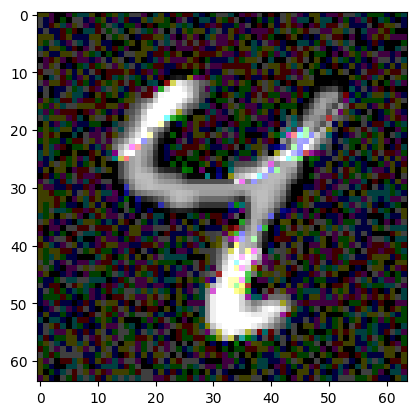

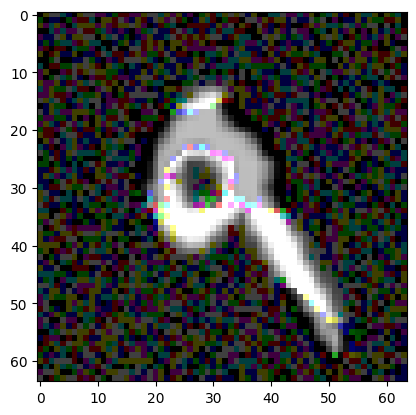

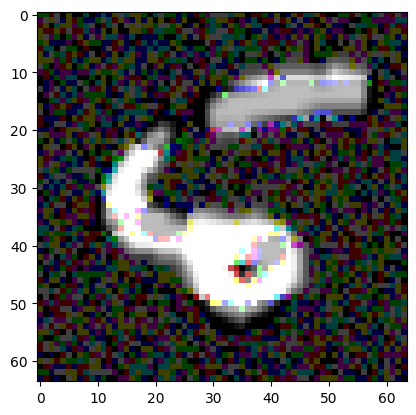

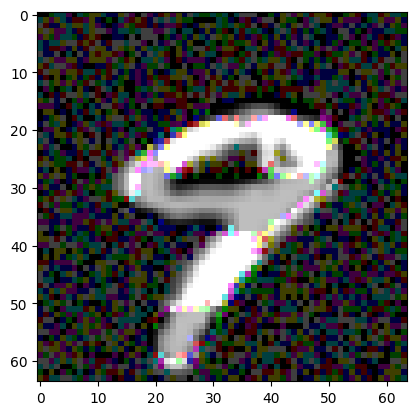

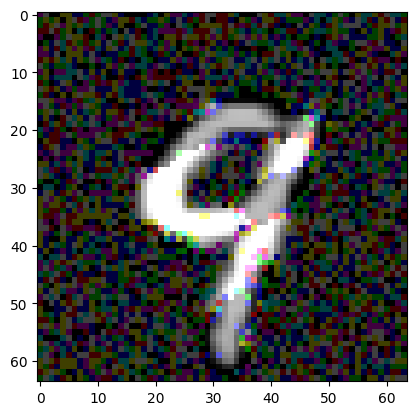

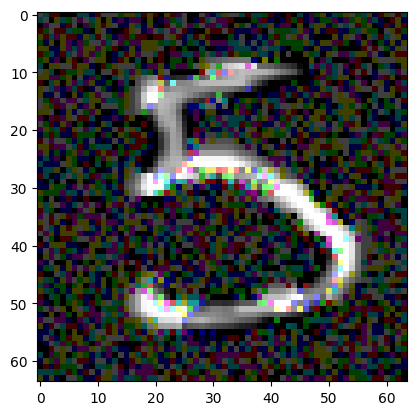

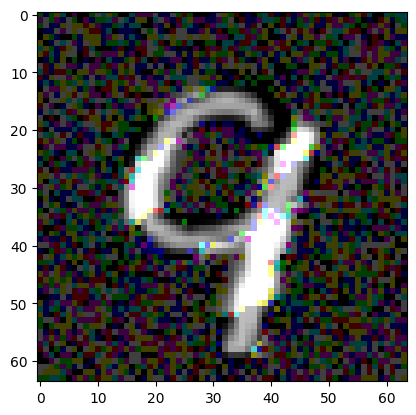

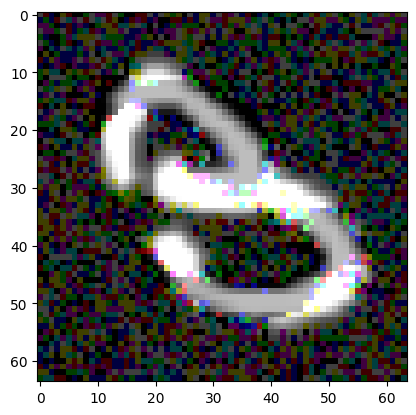

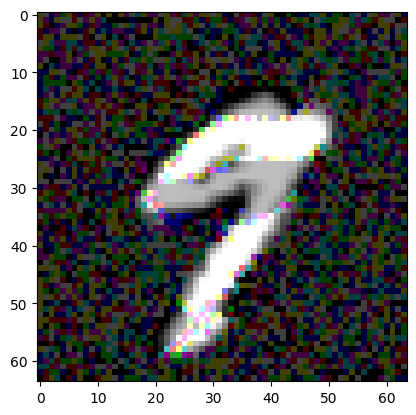

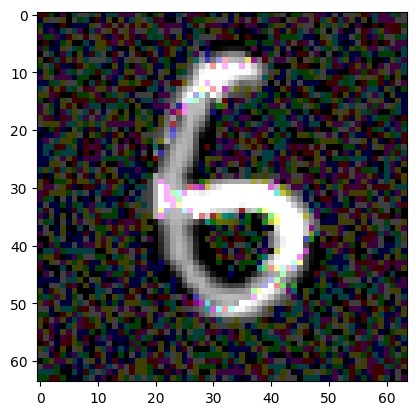

In [ ]:
for i in range(10):
  image = examples[1][i][2]
  image = np.transpose(image, (1, 2, 0))
  plt.imshow(image)
  plt.show()

In [ ]:
train_loader = torch.utils.data.DataLoader(train_set, batch_size=1,shuffle=True, num_workers=2)
accuracies = []
examples = []
print(epsilons[1])
acc, ex = test(model, device, train_loader, epsilons[1])
accuracies.append(acc)
examples.append(ex)

0.25


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epsilon: 0.25	Test Accuracy = 29186 / 60000 = 0.48643333333333333


In [ ]:
adversarial_examples = examples[0]
len(adversarial_examples)

29551

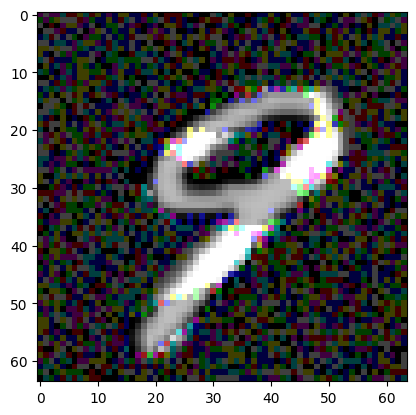

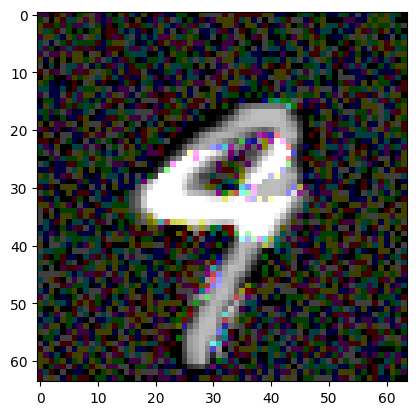

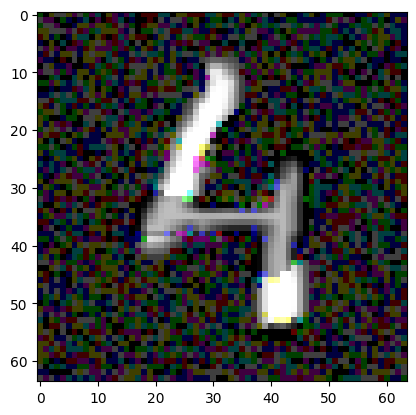

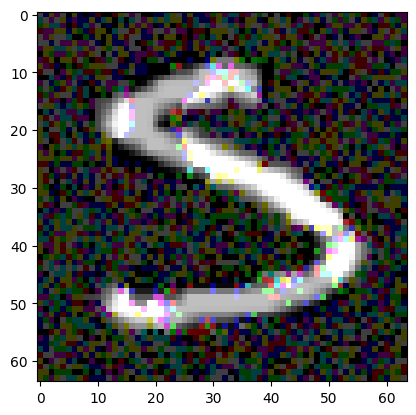

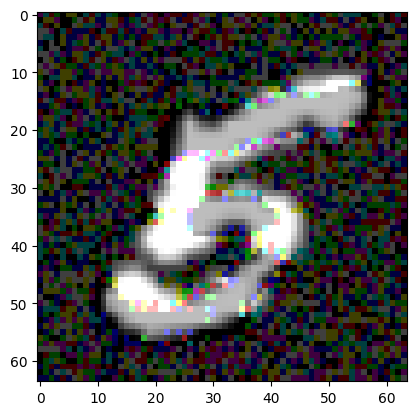

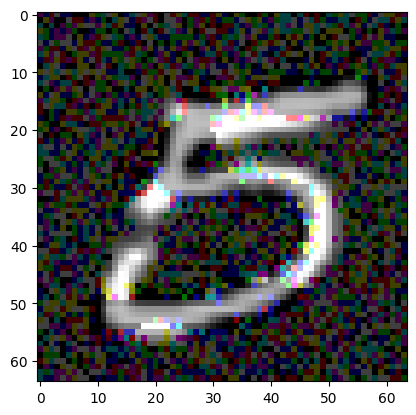

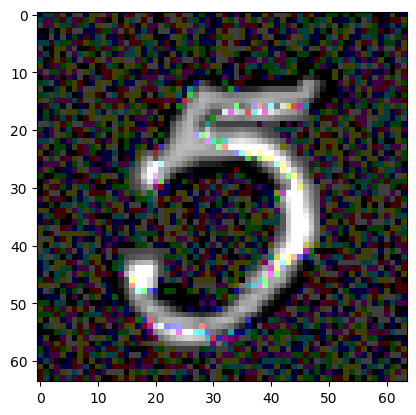

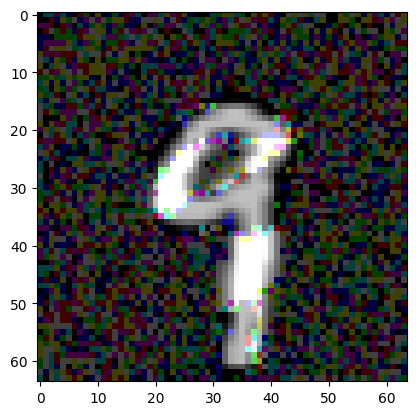

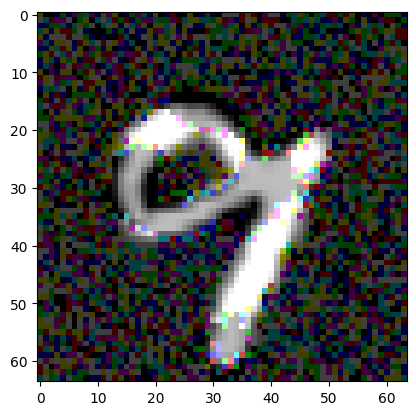

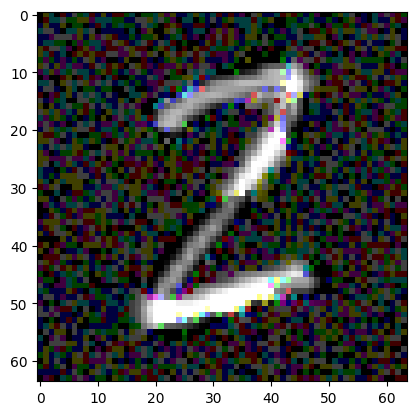

In [ ]:
for i in range(10):
  image = examples[0][i][2]
  image = np.transpose(image, (1, 2, 0))
  plt.imshow(image)
  plt.show()

In [ ]:
len(examples[0])

29551

In [ ]:
adversarial_dataset = []

for example in examples[0]:
  target, _, adversarial_example = example
  adversarial_dataset.append((adversarial_example, target))

mean = 0.1307
std = 0.3081

normalized_adversarial_dataset = []

for example, target in adversarial_dataset:
    normalized_example = (example - mean) / std
    normalized_adversarial_dataset.append((normalized_example, target))

In [ ]:
for original_test in train_set:
  image, target = original_test
  normalized_adversarial_dataset.append((image, target))

In [ ]:
print(len(normalized_adversarial_dataset))

89551


In [ ]:
adversarial_loader = torch.utils.data.DataLoader(adversarial_dataset, batch_size=32, shuffle=True)

In [ ]:
model = Net(num_classes=10).to(device)
# learning rate
learning_rate = 0.005
# loss function
criterion = nn.CrossEntropyLoss().to(device)
# optimizer
optimizer = optim.SGD(model.parameters(), lr=learning_rate)

train('run_vgg_number_adversarial', 'MNIST', model, criterion, optimizer, 30, adversarial_loader, test_loader)

100%|██████████| 924/924 [00:28<00:00, 32.43it/s]


In [ ]:
accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    #if eps == 0.25:
    acc, ex = test(model, device, test_loader, eps)
    accuracies.append(acc)
    examples.append(ex)

Epsilon: 0	Test Accuracy = 9369 / 10000 = 0.9369
Epsilon: 0.25	Test Accuracy = 2790 / 10000 = 0.279


In [ ]:
adversarial_loader = torch.utils.data.DataLoader(adversarial_dataset, batch_size=32, shuffle=True)


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (3,) + inhomogeneous part.

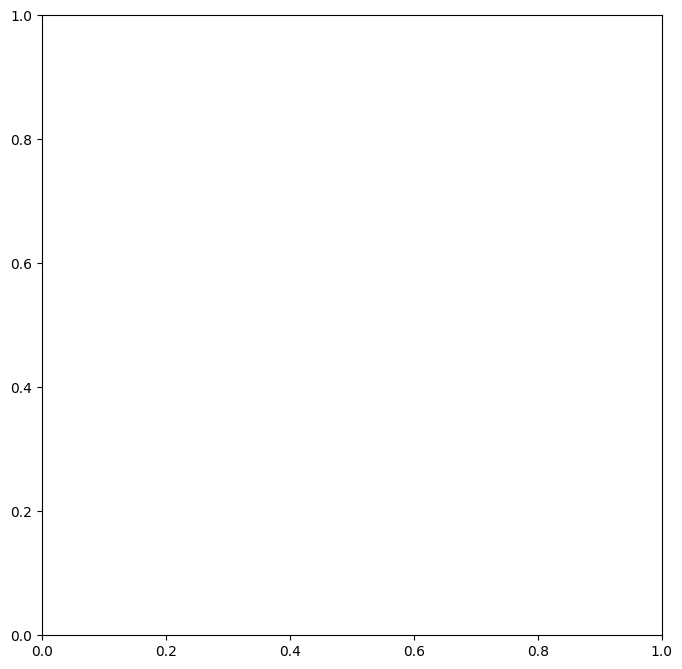

In [ ]:
# Plot several examples of adversarial samples at each epsilon
cnt = 0
plt.figure(figsize=(8, 10))
for i in range(len(epsilons)):
    for j in range(len(examples[i])):
        cnt += 1
        plt.subplot(len(epsilons), len(examples[0]), cnt)
        plt.xticks([], [])
        plt.yticks([], [])
        if j == 0:
            plt.ylabel(f"Eps: {epsilons[i]}", fontsize=14)
        orig, adv, ex = examples[i][j]
        plt.title(f"{orig} -> {adv}")
        plt.imshow(ex)

plt.tight_layout()
plt.show()

In [ ]:
import copy

def generate_adversarial_dataset(loader, model, device, epsilon):
    adversarial_dataset = []
    i = 0

    for data, target in loader:
        if i == 99:
          break

        data, target = data.to(device), target.to(device)
        data.requires_grad = True

        output = model(data)
        init_pred = output.max(1, keepdim=True)[1]

        if init_pred.item() != target.item():
            continue

        loss = F.nll_loss(output, target)
        model.zero_grad()
        loss.backward()
        data_grad = data.grad.data

        perturbed_data = fgsm_attack(data, epsilon, data_grad)
        #adversarial_dataset.append((data, target))  # Original example
        adversarial_dataset.append((perturbed_data, target))  # Adversarial example
        i += 1

    return adversarial_dataset

# Generate adversarial dataset from training_loader
epsilon = 0.25  # Choose your epsilon value
adversarial_dataset = generate_adversarial_dataset(training_loader, model, device, epsilon)

# Create DataLoader for the adversarial dataset
adversarial_loader = torch.utils.data.DataLoader(adversarial_dataset, batch_size=32, shuffle=True)

# Now you can use adversarial_loader for training with adversarial examples

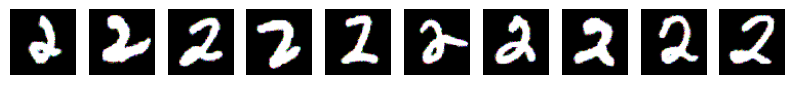

In [ ]:
images, _ = next(iter(adversarial_loader))

# Assuming the images are in Tensor format and are normalized
# You may need to adjust the normalization parameters based on how your images are preprocessed
# Assuming images are in RGB format and normalized with mean [0.5, 0.5, 0.5] and std [0.5, 0.5, 0.5]
unnormalize = transforms.Compose([
    torchvision.transforms.Grayscale(num_output_channels=3),
    transforms.Normalize(mean=(-1, -1, -1), std=(2, 2, 2)),
    transforms.ToPILImage()
])

# Plot three example images
fig, axes = plt.subplots(1, 10, figsize=(10, 4))

for i in range(10):
    image = (images[i].cpu().detach().numpy())[0]
    image = np.transpose(image, (1, 2, 0))
    #image = unnormalize(images[i])  # Convert normalized image back to PIL format
    axes[i].imshow(image)
    axes[i].axis('off')

plt.show()

In [ ]:
transform = transforms.Compose([transforms.Resize((227,227)), torchvision.transforms.Grayscale(num_output_channels=3), transforms.ToTensor(), transforms.Normalize((0.7,), (0.7,)),])
train_set = torchvision.datasets.MNIST(root="./data", train=True,download=True, transform=transform)
test_set = torchvision.datasets.MNIST(root="./data", train=False,download=True, transform=transform)

training_loader = torch.utils.data.DataLoader(train_set, batch_size=32,shuffle=True, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32,shuffle=False, num_workers=2)

In [ ]:

# FGSM attack code
def fgsm_attack(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()
    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_data_grad
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)
    # Return the perturbed image
    return perturbed_image

# restores the tensors to their original scale
def denorm(batch, mean=[0.7], std=[0.7]):
    """
    Convert a batch of tensors to their original scale.

    Args:
        batch (torch.Tensor): Batch of normalized tensors.
        mean (torch.Tensor or list): Mean used for normalization.
        std (torch.Tensor or list): Standard deviation used for normalization.

    Returns:
        torch.Tensor: batch of tensors without normalization applied to them.
    """
    if isinstance(mean, list):
        mean = torch.tensor(mean).to(device)
    if isinstance(std, list):
        std = torch.tensor(std).to(device)

    return batch * std.view(1, -1, 1, 1) + mean.view(1, -1, 1, 1)



def test( model, device, test_loader, epsilon ):

    # Accuracy counter
    correct = 0
    adv_examples = []

    # Loop over all examples in test set
    for data, target in test_loader:

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        # If the initial prediction is wrong, don't bother attacking, just move on
        if not init_pred.squeeze().eq(target).all().item():
            continue

        # Calculate the loss
        loss = F.nll_loss(output, target)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect ``datagrad``
        data_grad = data.grad.data

        # Restore the data to its original scale
        data_denorm = denorm(data)

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data_denorm, epsilon, data_grad)

        # Reapply normalization
        perturbed_data_normalized = transforms.Normalize((0.7,), (0.7,))(perturbed_data)

        # Re-classify the perturbed image
        output = model(perturbed_data_normalized)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        if final_pred.item() == target.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if epsilon == 0 and len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print(f"Epsilon: {epsilon}\tTest Accuracy = {correct} / {len(test_loader)} = {final_acc}")

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples

In [ ]:
model = VGG16(num_classes=10).to(device)
epsilons = [0, .05, .1, .15, .2, .25, .3]
accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(model, device, test_loader, eps)
    accuracies.append(acc)
    examples.append(ex)

Epsilon: 0	Test Accuracy = 0 / 313 = 0.0
Epsilon: 0.05	Test Accuracy = 0 / 313 = 0.0
Epsilon: 0.1	Test Accuracy = 0 / 313 = 0.0


KeyboardInterrupt: 